# **Stromal subcluster**

In [ ]:
import sys
sys.path.append("../code")

In [ ]:
from code.data_prep.io import *
from code.data_prep.processing import *
from code.plotting.plot_settings import *
from code.plotting.palette import *

In [1]:
import scanpy as sc
from pathlib import Path
import numpy as np
import pandas as pd
import scrublet as scr

import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline
sc.settings.verbosity=3

In [3]:
main_dir = "/projects/robson-lab/research/endometriosis/"
sample_id = "Endometriosis-revision-3"
sub_dir = "Stromal"

sc.settings.figdir = f"{main_dir}figures/{sample_id}"
matplotlib.rcParams["figure.facecolor"]="white"

In [5]:
sc.set_figure_params(dpi=150, color_map='Reds')
sns.set_style("white")

---

---

In [6]:
full = sc.read_h5ad(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-Stro-20220103.h5ad")

In [7]:
full

AnnData object with n_obs × n_vars = 43716 × 24401
    obs: 'sequencing_saturation', 'Patient_id', 'stage', 'scrublet_predicted_doublet', 'scrublet_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'pct_counts_mitochondrial', 'total_counts_hemoglobin', 'log1p_total_counts_hemoglobin', 'pct_counts_hemoglobin', 'library', '10x_chemistry', 'sample_name', 'sampleid', 'sample_type', 'leiden', 'leiden_R1', 'leiden_R2', 'leiden_R3', 'leiden_R4', 'leiden_R5', 'leiden_R6', 'leiden_R7', 'visible_doublet', 'cluster', 'cluster_R1', 'celltype', 'celltype_main'
    var: 'gene_ids', 'mitochondrial', 'hemoglobin', 'total_counts', 'n_cells_by_counts', 'ribosomal', 'cell_cycle', 'stress_response', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_cells'
    u

#### Batch Corrections & UMAP Computing

In [8]:
%load_ext rpy2.ipython

In [9]:
sc.pp.pca(full, svd_solver="arpack",use_highly_variable=True)

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:03)


In [10]:
pcs = full.obsm["X_pca"]
metadata = full.obs
covariates = ["Patient_id","stage"]
thetas = np.array([2,1])

In [11]:
%%R -i pcs -i covariates -i thetas -i metadata -o pcs_harmony
library(harmony)
pcs_harmony <- HarmonyMatrix(
    pcs,
    metadata,
    vars_use=covariates,
    theta=thetas,
    do_pca=FALSE
)

R[write to console]: Loading required package: Rcpp

R[write to console]: Harmony 1/10

R[write to console]: 0%   10   20   30   40   50   60   70   80   90   100%

R[write to console]: [----|----|----|----|----|----|----|----|----|----|

R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[write to console]: *
R[

In [13]:
harmonized = load_pcs(full, pcs_harmony)

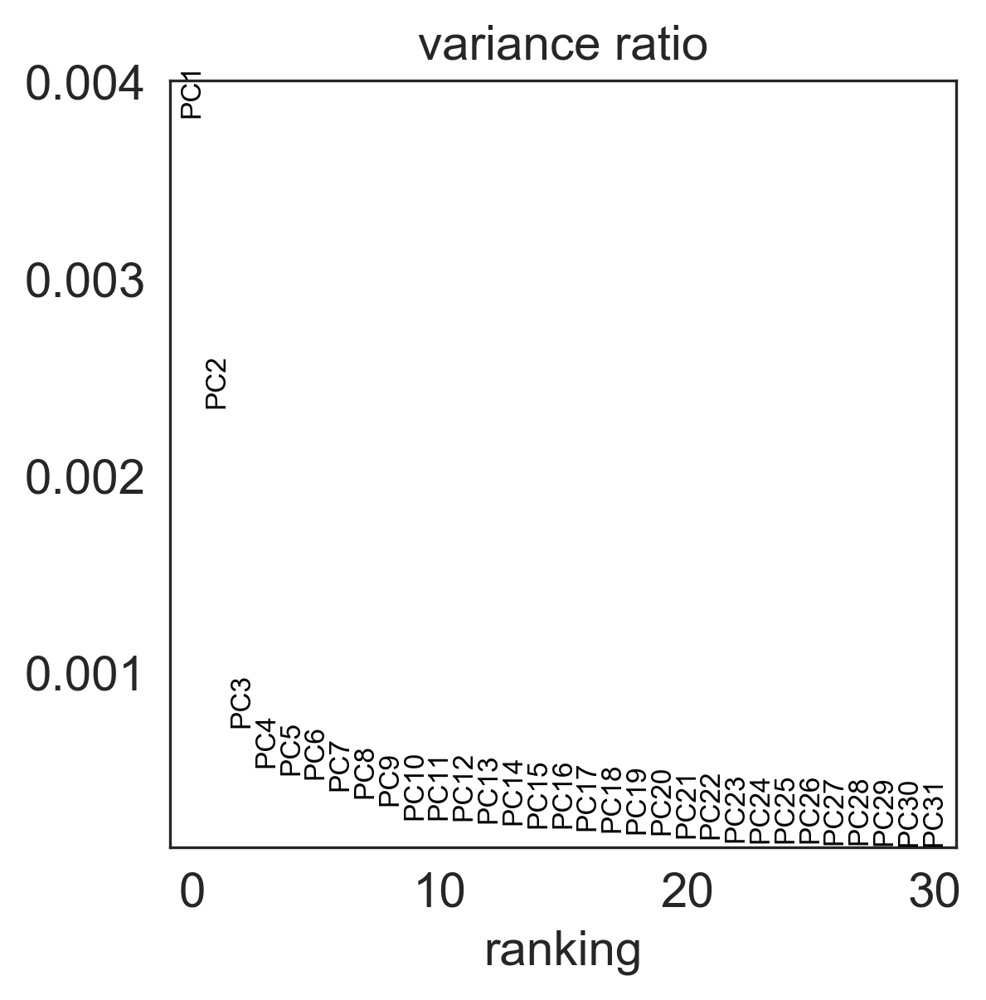

In [14]:
sc.pl.pca_variance_ratio(harmonized,show=False)

In [ ]:
sc.pp.neighbors(harmonized, n_neighbors=25, n_pcs=18, metric="correlation")
sc.tl.umap(harmonized, min_dist=0.05)

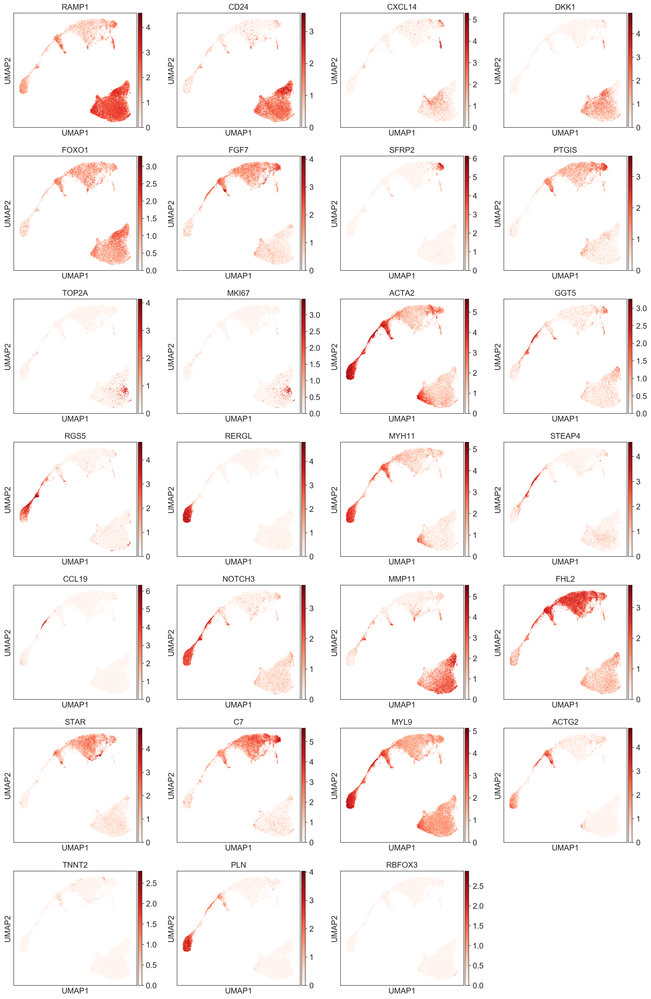

In [16]:
sc.pl.umap(harmonized, color = ["RAMP1","CD24","CXCL14","DKK1","FOXO1","FGF7",
                                "SFRP2","PTGIS","TOP2A","MKI67",
                                "ACTA2","GGT5","RGS5","RERGL",
                                "MYH11","STEAP4","CCL19","NOTCH3",
                                "MMP11","FHL2","STAR","C7","MYL9","ACTG2","TNNT2","PLN","RBFOX3"],
           color_map='Reds')

---

#### Clustering

running Leiden clustering


/opt/conda/lib/python3.7/site-packages/scanpy/tools/_leiden.py:111: FutureWarning: This location for 'connectivities' is deprecated. It has been moved to .obsp[connectivities], and will not be accesible here in a future version of anndata.
  adjacency = adata.uns['neighbors']['connectivities']


    finished: found 16 clusters and added
    'stro_leiden_R6', the cluster labels (adata.obs, categorical) (0:00:20)


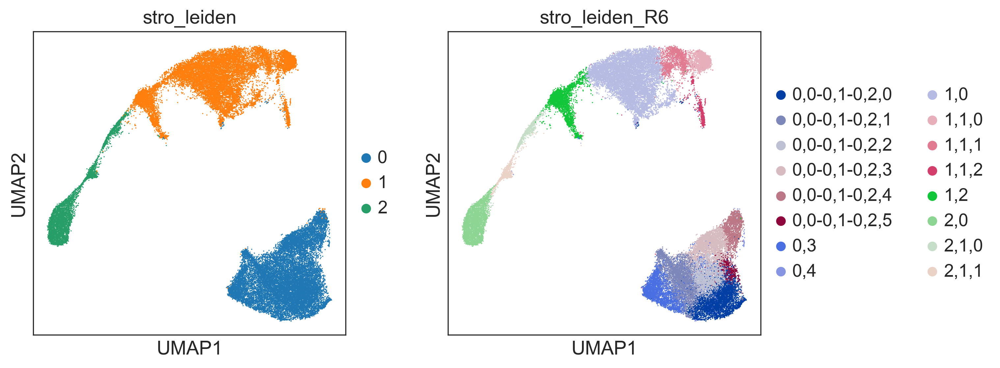

In [57]:
sc.tl.leiden(harmonized, resolution=0.1, key_added="stro_leiden")
sc.tl.leiden(harmonized, resolution=0.4,key_added="stro_leiden_R1",restrict_to=('stro_leiden',["0"]))
sc.tl.leiden(harmonized, resolution=0.2,key_added="stro_leiden_R2",restrict_to=('stro_leiden_R1',["1"]))
sc.tl.leiden(harmonized, resolution=0.2,key_added="stro_leiden_R3",restrict_to=('stro_leiden_R2',["2"]))
sc.tl.leiden(harmonized, resolution=0.2,key_added="stro_leiden_R4",restrict_to=('stro_leiden_R3',["1,1"]))
sc.tl.leiden(harmonized, resolution=0.1,key_added="stro_leiden_R5",restrict_to=('stro_leiden_R4',["2,1"]))
sc.tl.leiden(harmonized, resolution=0.6,key_added="stro_leiden_R6",restrict_to=('stro_leiden_R5',["0,0","0,1","0,2"]))
sc.pl.umap(harmonized, 
           color=["stro_leiden","stro_leiden_R6"],
           ncols= 3,
           use_raw=False,
          )

In [58]:
save_adata(harmonized, "harmonized-stro", subdir=sub_dir)

---

#### Doublet Identification

***Visible doublet***

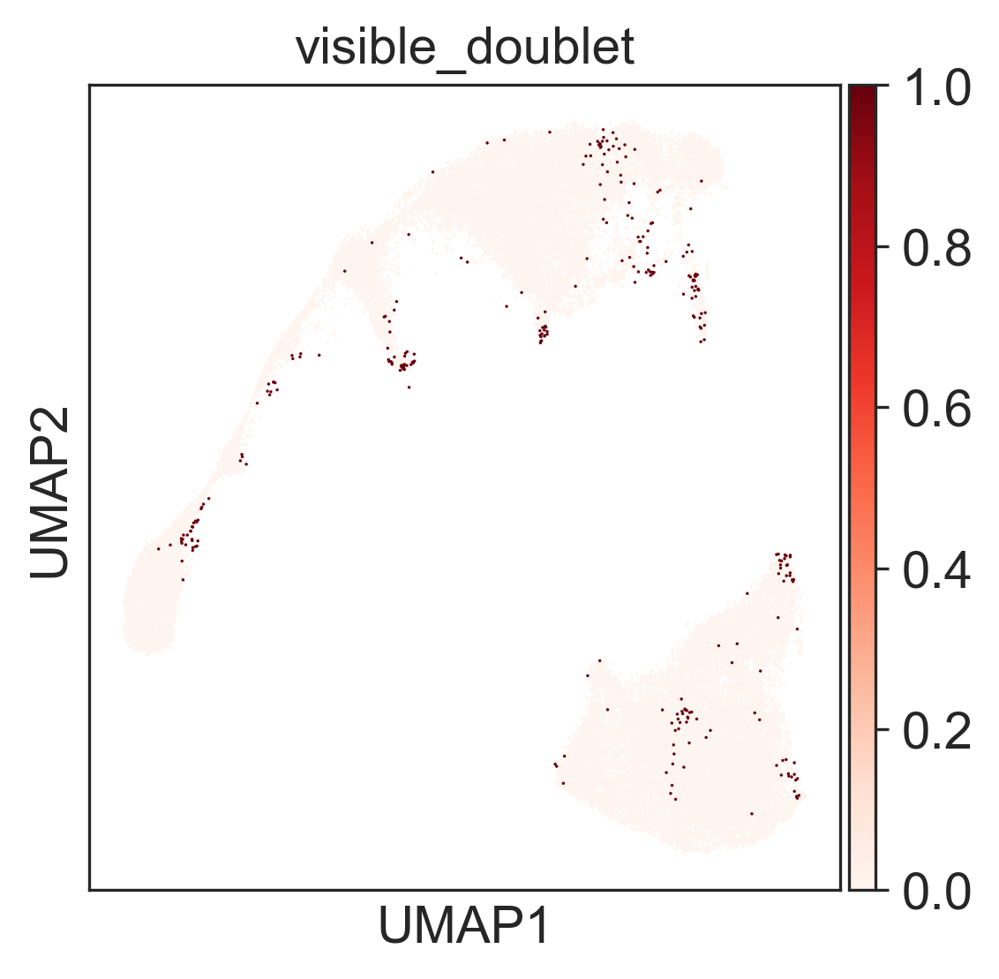

In [60]:
detect_umap_doublets(harmonized, cluster_key= "stro_leiden_R6", t=10)
sc.pl.umap(harmonized,color=["visible_doublet"], color_map="Reds")

In [61]:
clean = harmonized[~harmonized.obs.visible_doublet,:].copy()

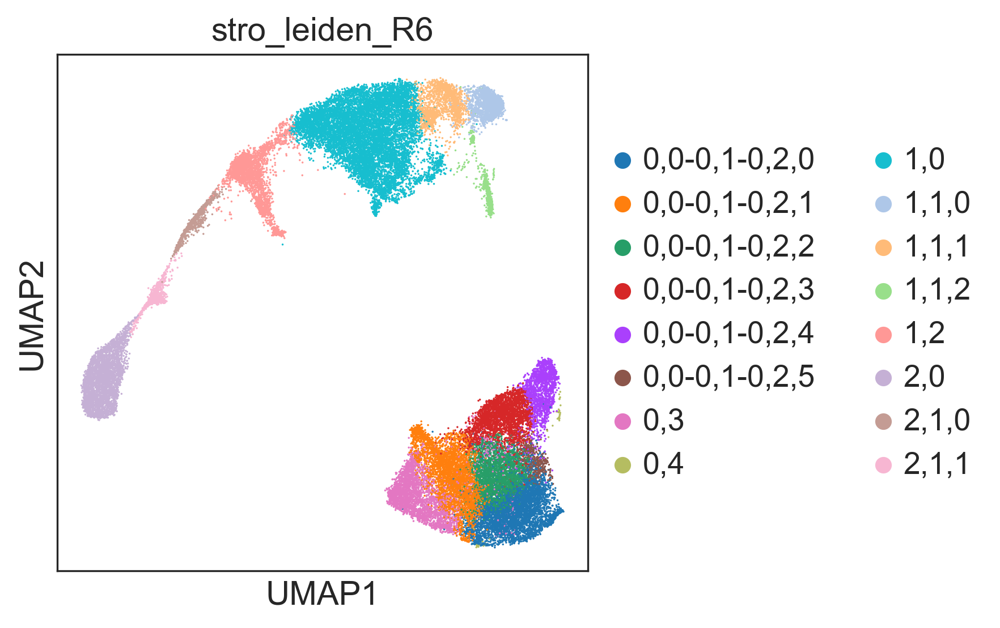

In [62]:
sc.pl.umap(clean,color=["stro_leiden_R6"], color_map="Reds")

In [64]:
reorder_clusters_hierarchical(clean,cluster_key="stro_leiden_R6",new_key='stro_cluster')

AnnData object with n_obs × n_vars = 43415 × 24401
    obs: 'sequencing_saturation', 'Patient_id', 'stage', 'scrublet_predicted_doublet', 'scrublet_score', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mitochondrial', 'log1p_total_counts_mitochondrial', 'pct_counts_mitochondrial', 'total_counts_hemoglobin', 'log1p_total_counts_hemoglobin', 'pct_counts_hemoglobin', 'library', '10x_chemistry', 'sample_name', 'sampleid', 'sample_type', 'leiden', 'leiden_R1', 'leiden_R2', 'leiden_R3', 'leiden_R4', 'leiden_R5', 'leiden_R6', 'leiden_R7', 'cluster', 'cluster_R1', 'celltype', 'celltype_main', 'stro_leiden', 'stro_leiden_R1', 'stro_leiden_R2', 'stro_leiden_R3', 'stro_leiden_R4', 'stro_leiden_R5', 'stro_leiden_R6', 'visible_doublet', 'stro_cluster'
    var: 'gene_ids', 'mitochondrial', 'hemoglobin', 'total_counts', 'n_cel

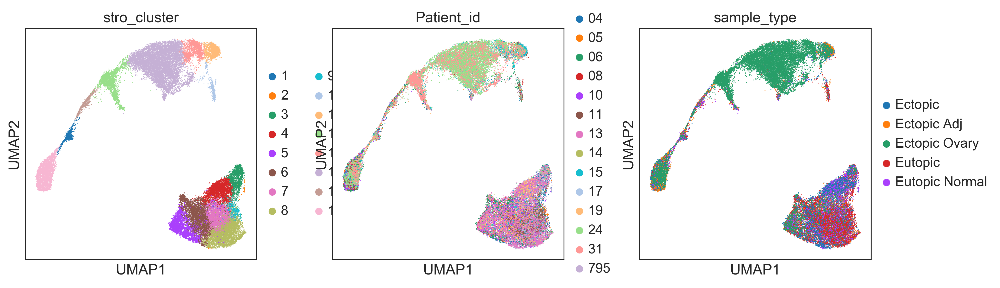

In [65]:
sc.pl.umap(clean, color=["stro_cluster","Patient_id","sample_type"])

In [66]:
#remove B-cells contamination
clean = clean[clean[:, ["CD19", "JCHAIN"]].X.sum(axis=1) == 0].copy()

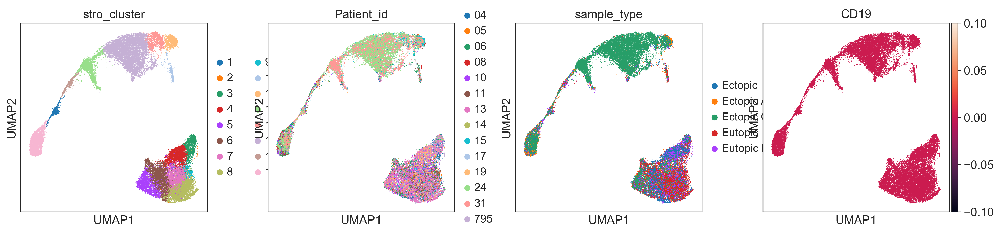

In [67]:
sc.pl.umap(clean, color=["stro_cluster","Patient_id","sample_type", "CD19"])

In [68]:
save_adata(clean,"scrubs-clean-stro",subdir=sub_dir)

---

### Final Subtypes Clustering
date: Nov 11th, 2021
<br> Final clustering based on previous analysis (cell type markers, differential gene expression, literature reviews)

In [ ]:
clean = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-scrubs-clean-stro-20210103.h5ad")

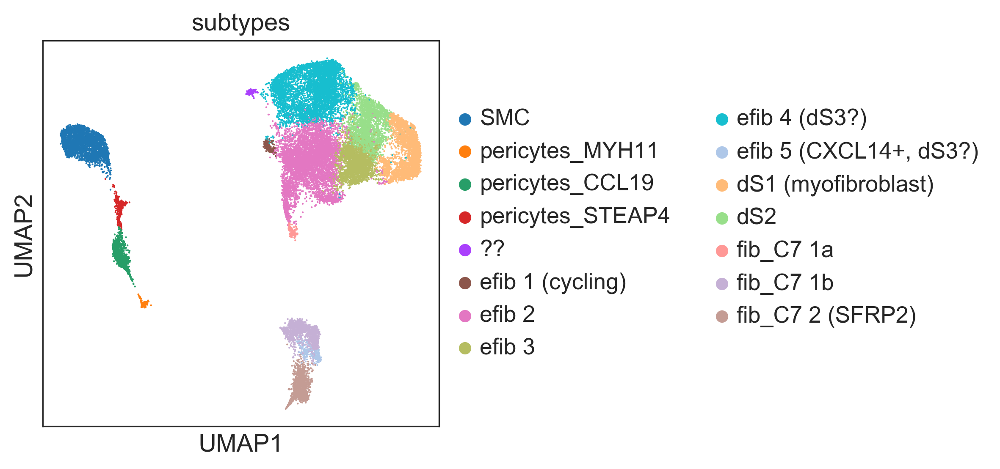

In [40]:
old_stro = sc.read(
    f"{main_dir}/data/h5ad/Endo-Tissue-EC19001-EC20015/{sub_dir}/Endo-Tissue-EC19001-EC20015-final-stro-20210126.h5ad")
sc.pl.umap(old_stro, color="subtypes")

In [70]:
clean.obs["old_subtypes"] = old_stro.obs["subtypes"]

clean.obs["old_subtypes"] = clean.obs["old_subtypes"].astype(str)
clean.obs["old_subtypes"].fillna('unassigned', inplace=True)
clean.obs["old_subtypes"] = clean.obs["old_subtypes"].astype("category")
clean.obs.tail(3)

,sequencing_saturation,Patient_id,stage,scrublet_predicted_doublet,scrublet_score,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,...,stro_leiden,stro_leiden_R1,stro_leiden_R2,stro_leiden_R3,stro_leiden_R4,stro_leiden_R5,stro_leiden_R6,visible_doublet,stro_cluster,old_subtypes
index,,,,,,,,,,,,,,,,,,,,,
TTTGGTTTCTTACTGT-1-30,68.494501,31,4,False,0.063492,3223,8.078378,9911.0,9.201502,30.511553,...,1,1,"1,2","1,2","1,2","1,2","1,2",False,12,nan
TTTGTTGCAGGGTTGA-1-30,70.708194,31,4,False,0.169687,2098,7.649216,6320.0,8.751633,35.031646,...,1,1,"1,2","1,2","1,2","1,2","1,2",False,12,nan
TTTGTTGGTTAGGGAC-1-30,70.130717,31,4,False,0.047546,3102,8.040125,10077.0,9.218110,31.973802,...,1,1,"1,0","1,0","1,0","1,0","1,0",False,14,nan


Trying to set attribute `.uns` of view, copying.


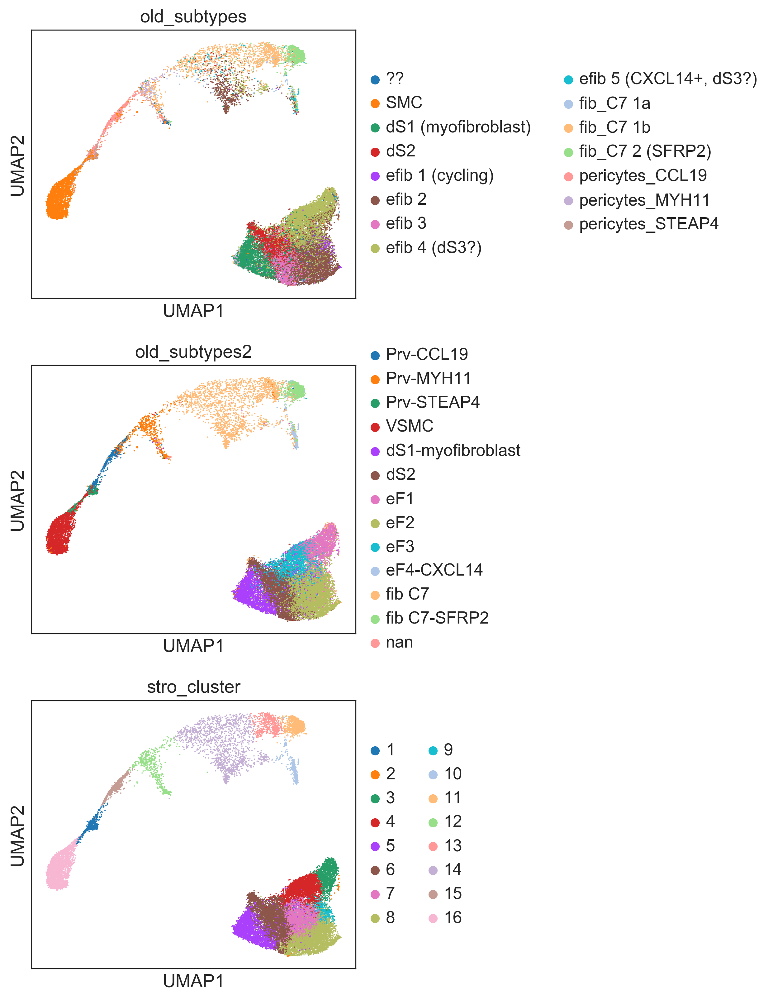

In [72]:
sc.pl.umap(clean[clean.obs.old_subtypes !="nan"], color=["old_subtypes","stro_cluster"],ncols=1)

In [75]:
clean.obs["stro_cluster_R1"] = clean.obs.stro_cluster.map({
    "1":"11",
    "2":"1",
    "3":"1",
    "4":"2",
    "5":"3",
    "6":"4",
    "7":"5",
    "8":"5",
    "9":"5",
    "10":"6",
    "11":"7",
    "12":"8",
    "13":"9",
    "14":"9",
    "15":"10",
    "16":"12"
})

... storing 'stro_cluster_R1' as categorical


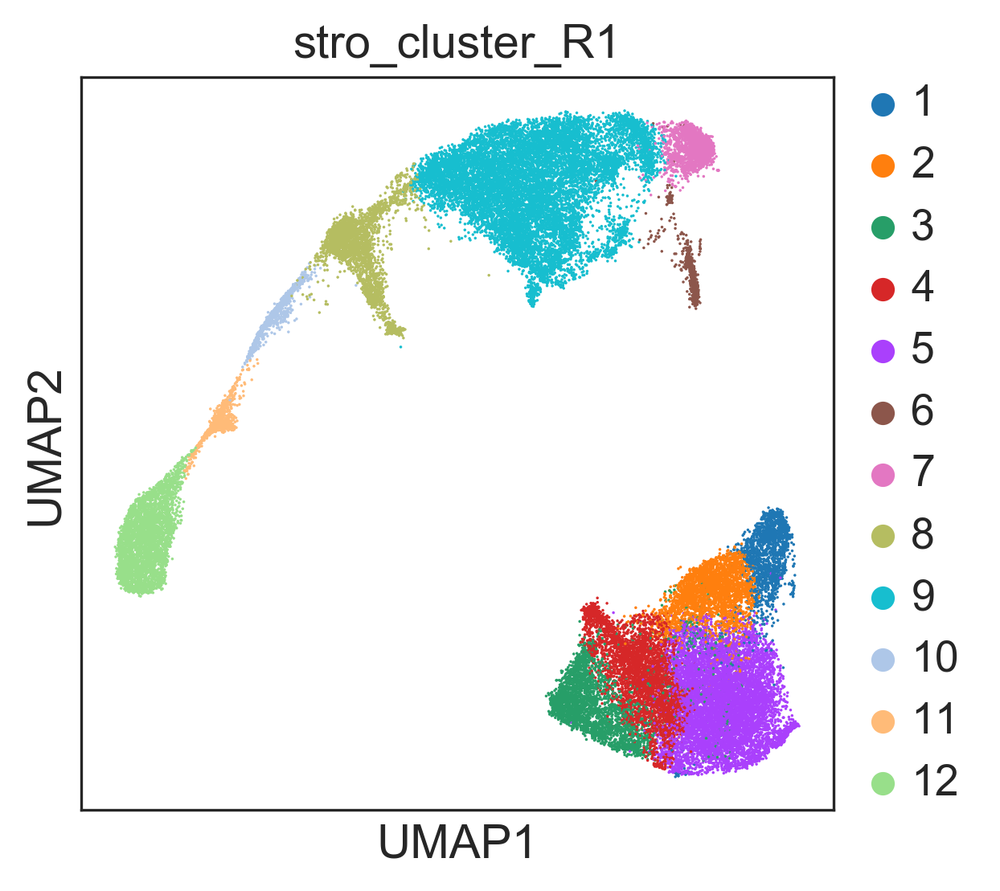

In [76]:
sc.pl.umap(clean, color=["stro_cluster_R1"])

... storing 'subtypes' as categorical


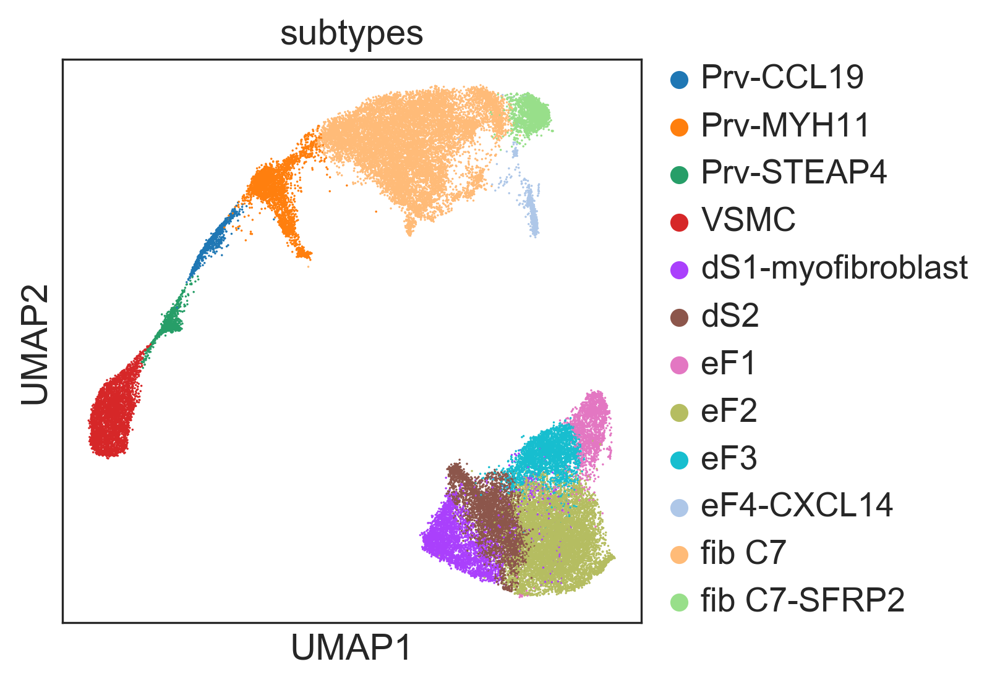

In [95]:
clean.obs["subtypes"] = clean.obs.stro_cluster_R1.map({
    "1":"eF1",
    "2":"eF3",
    "3":"dS1-myofibroblast",
    "4":"dS2",
    "5":"eF2",
    "6":"eF4-CXCL14",
    "7":"fib C7-SFRP2",
    "8":"Prv-MYH11",
    "9":"fib C7",
    "10":"Prv-CCL19",
    "11":"Prv-STEAP4",
    "12":"VSMC",
})

sc.pl.umap(clean, color=["subtypes"])

In [96]:
clean.obs["subtypes"].cat.reorder_categories([
    "eF1","eF2","eF3","dS1-myofibroblast","dS2","eF4-CXCL14",
    "fib C7-SFRP2","fib C7","Prv-MYH11","Prv-CCL19","Prv-STEAP4","VSMC"
],
    inplace=True)

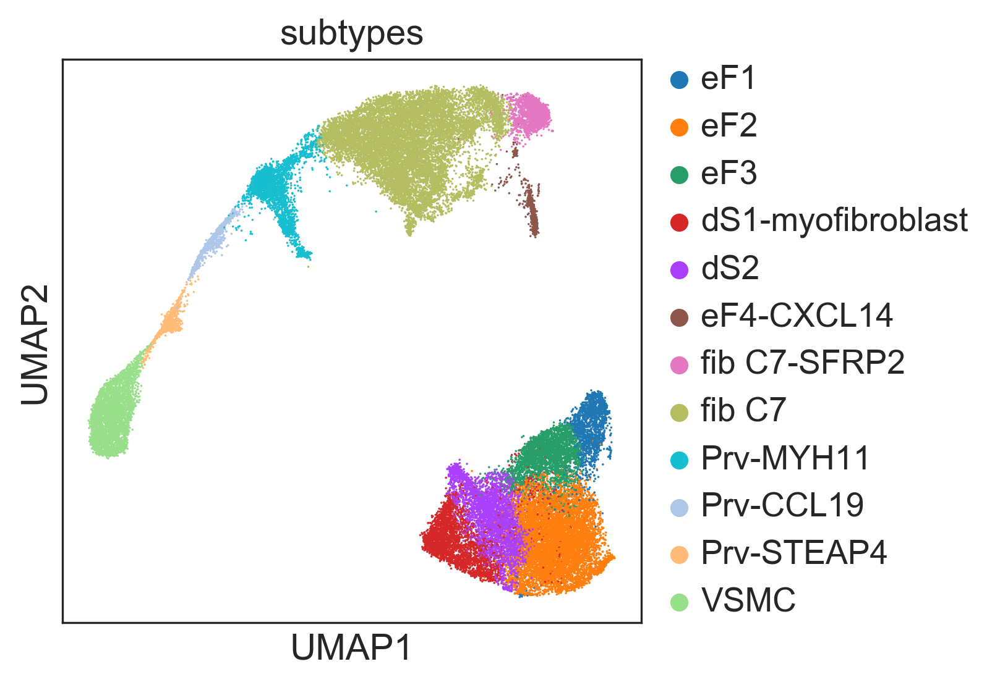

In [97]:
sc.pl.umap(clean, color=["subtypes"])

In [98]:
save_adata(clean,"final-stro",subdir=sub_dir)

In [ ]:
final_cluster = sc.read(f"{main_dir}data/h5ad/{sample_id}/{sub_dir}/{sample_id}-final-stro-20220103.h5ad")

***Cell_type Markers***

Note:
`sc.tl.rank_genes_groups(adata, groupby="cluster",use_raw=False,)` and `sc.tl.filter_rank_genes_groups(clean, use_raw=False)` will cause warning for adata saving, and subsequently error in adata loading. Copy the adata and run this function for doublet identification purpose. Once `doublet` identified, filter and save the original `adata`.

In [99]:
clean_copy = clean.copy()
#clean_copy.raw = sc.AnnData(clean_copy.layers["raw"], var=clean_copy.var, obs=clean_copy.obs)
clean_copy.raw = clean_copy
sc.tl.rank_genes_groups(clean_copy, groupby="subtypes",use_raw=False, method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:25)


Filtering genes using: min_in_group_fraction: 0.7 min_fold_change: 0.5, max_out_group_fraction: 0.5
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_subtypes']`


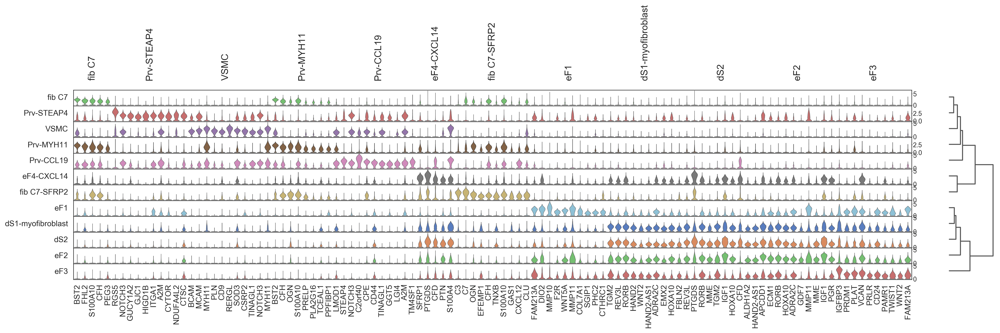

In [100]:
sc.tl.filter_rank_genes_groups(clean_copy,use_raw=False,key="rank_genes_groups", 
                               min_in_group_fraction= 0.7,min_fold_change= 0.5, max_out_group_fraction= 0.5)
sc.pl.rank_genes_groups_stacked_violin(clean_copy,key='rank_genes_groups_filtered', n_genes=10)

In [78]:
markers = ["RAMP1","IGF1","PCOLCE","C7","OGN","MMP11","SFRP1","SFRP2","CXCL14","DKK1","FOXO1","IL15"]
st = ["MKI67","SMO","PTCH1",
      "RAMP1","PTGDS","CXCL12","MME","TIMP3","ACTA2","ESR1","PGR","WNT5A","LEFTY2","PRLR", #eS
      "STAR","FHL2","SCN7A", #ovary_fib
      "RGS5","RERGL","GGT5","MYH11","STEAP4","CCL19"] #pericyte
dS=["IGFBP1","CLEC2D","PDGFRA"]

mens_cycle = ["RAMP1","MME","ESR1","PGR","C7",
               "STC1","NFATC2","BMP2","PMAIP1", #mens_phase
               "MMP11","WNT5A","SFRP1","IGF1", #pro_phase
               "S100A4","DKK1","FOXO1","IL15","CXCL14", #sec_phase
               "FGF7","LMCD1"] #late-sec_phase

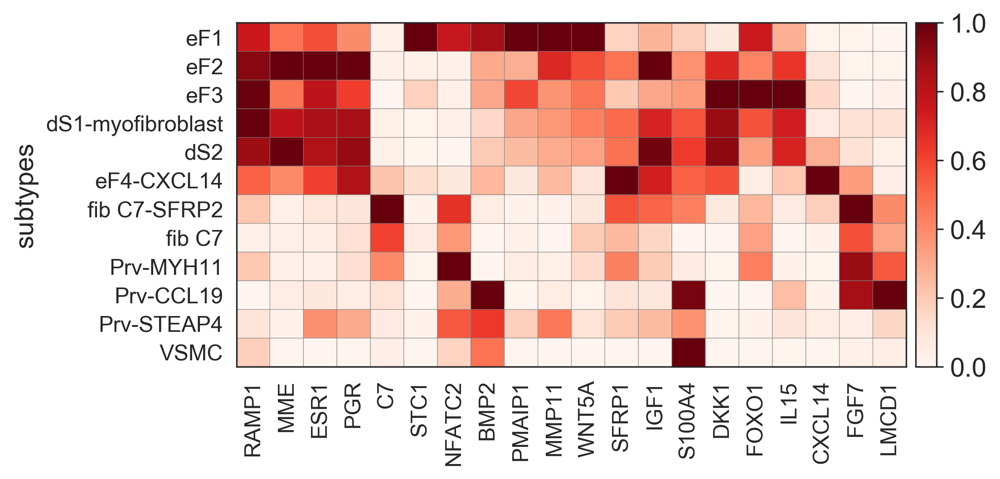

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[6.4, 0, 0.2])

In [105]:
sc.pl.matrixplot(clean, mens_cycle,groupby="subtypes",cmap="Reds",standard_scale='var')

2. Finding differences in endometrial fibroblast compared to 'Eutopic Normal'

In [107]:
clean_copy =  clean.copy()
eFibs  = ["eF1","eF2","eF3","eF4-CXCL14","dS1-myofibroblast","dS2"]
endom_fib = clean_copy[clean_copy.obs.subtypes.isin(eFibs)]

In [108]:
endom_fib.obs.subtypes.value_counts()

eF2                  7979
dS2                  3982
dS1-myofibroblast    3025
eF3                  2857
eF1                  1691
eF4-CXCL14            791
Name: subtypes, dtype: int64

ranking genes


Trying to set attribute `.uns` of view, copying.


    finished: added to `.uns['versus_normal']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:39)
Filtering genes using: min_in_group_fraction: 0.5 min_fold_change: 1, max_out_group_fraction: 0.3
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample_type']`
categories: Ectopic, Ectopic Adj, Ectopic Ovary, etc.
var_group_labels: Ectopic, Ectopic Adj, Ectopic Ovary, etc.


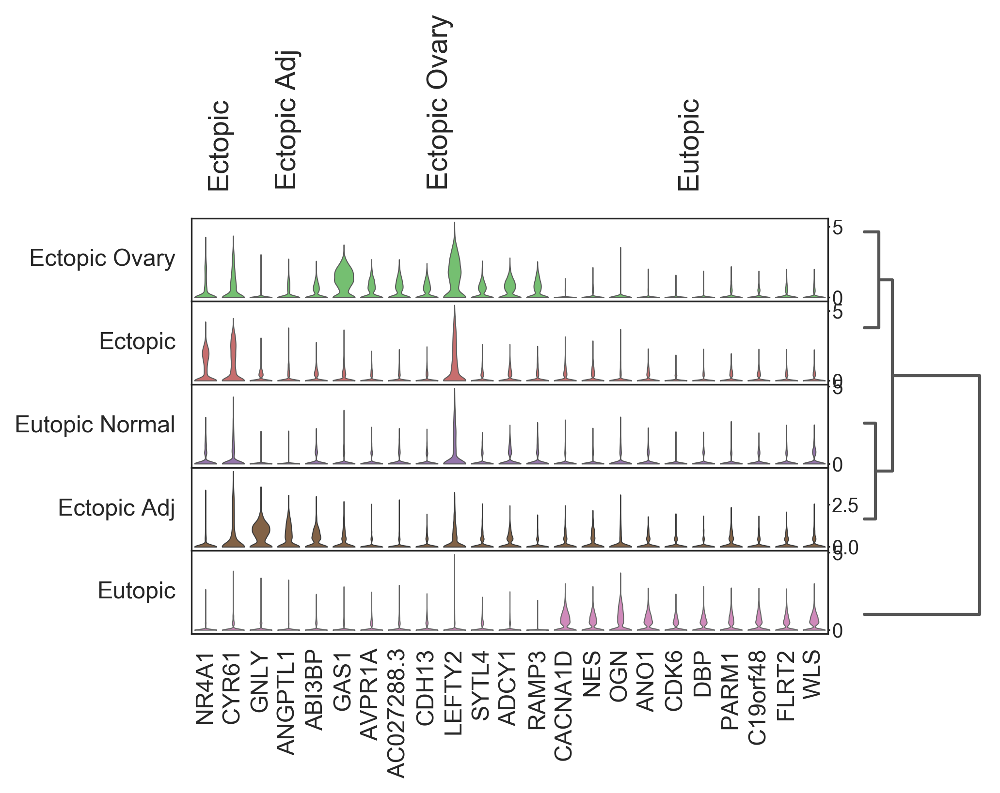

In [109]:
sc.tl.rank_genes_groups(endom_fib, groupby="sample_type",use_raw=False,method='wilcoxon',
                        n_genes=250, key_added="versus_normal",
                        reference="Eutopic Normal"
                       )
sc.tl.filter_rank_genes_groups(endom_fib,use_raw=False,
                               key = 'versus_normal', 
                               key_added= "versus_normal_filtered",
                               min_fold_change=1, min_in_group_fraction=0.5, max_out_group_fraction=0.3)
sc.pl.rank_genes_groups_stacked_violin(endom_fib,key='versus_normal_filtered', n_genes=50)

---